# Expression counter (simple or n-gram) from RIS file

Bigrams fréquents : {'cybersecurity in': 2812, 'in industrial': 842, 'industrial control': 3434, 'control systems': 5455, 'systems issues': 8, 'technologies and': 1428, 'and challenges': 1438, 'challenges industrial': 9, 'systems icss': 147, 'play an': 218, 'an important': 1708, 'important role': 460, 'role in': 2079, 'in today': 831, 'today s': 1413, 's industry': 15, 'industry by': 57, 'by providing': 637, 'process automation': 152, 'automation distributed': 6, 'distributed control': 304, 'control and': 1908, 'and process': 324, 'process monitoring': 57, 'was designed': 185, 'designed to': 1744, 'to be': 8303, 'be used': 3465, 'used in': 2967, 'in an': 2632, 'an isolated': 41, 'area or': 9, 'or connected': 11, 'connected to': 763, 'to other': 753, 'other systems': 76, 'systems via': 44, 'communication mechanisms': 15, 'mechanisms or': 10, 'protocols this': 48, 'this setup': 9, 'manufacturers to': 50, 'to manage': 762, 'manage their': 91, 'their production': 20, 'production processes'

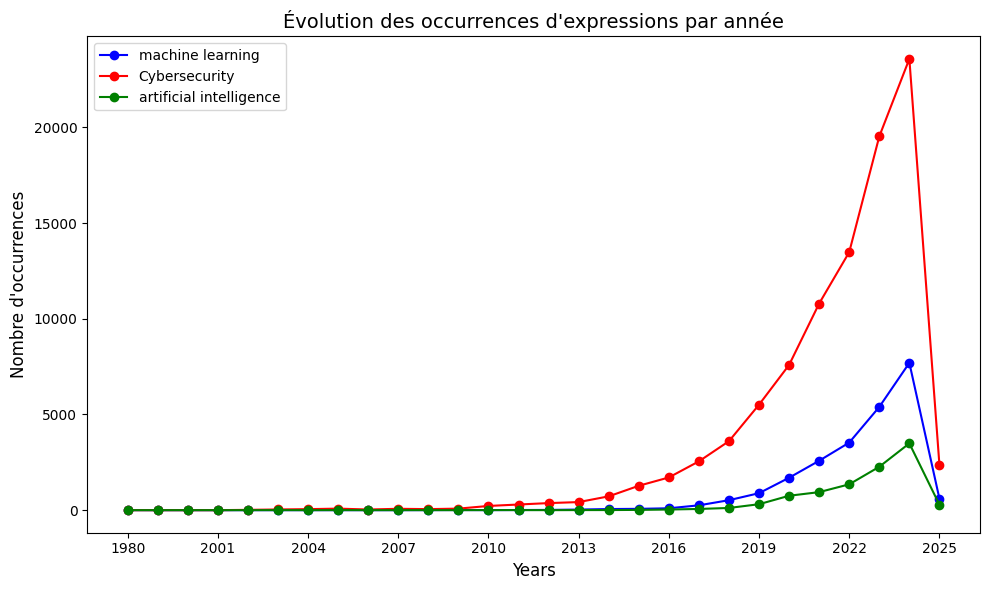

In [33]:
import re
from collections import defaultdict, Counter
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt

def parse_ris_file(filepath):
    """
    Lit le fichier RIS et retourne une liste de dictionnaires,
    chaque dictionnaire correspondant à une référence.
    Chaque champ (par ex. PY, TI, AB, KW) est stocké sous forme de liste.
    """
    with open(filepath, 'r', encoding='utf-8') as f:
        content = f.read()
    
    # Séparer les enregistrements (chaque référence se termine par "ER  -")
    records_raw = content.split("ER  -")
    records = []
    for rec in records_raw:
        rec = rec.strip()
        if not rec:
            continue
        record = defaultdict(list)
        # Chaque ligne est de la forme "XX  - valeur"
        for line in rec.splitlines():
            if not line.strip():
                continue
            m = re.match(r'^([A-Z0-9]{2})  - (.*)$', line)
            if m:
                tag = m.group(1)
                value = m.group(2).strip()
                record[tag].append(value)
        records.append(record)
    return records

def tokenize(text):
    """
    Convertit le texte en minuscules et extrait les tokens (mots)
    à l’aide d’une expression régulière.
    """
    return re.findall(r'\b\w+\b', text.lower())

def process_records(records):
    """
    Pour chaque référence, extrait l'année (PY) et combine les champs TI, AB et KW.
    Retourne un dictionnaire : année -> texte agrégé (en minuscules).
    """
    aggregated_text = defaultdict(str)
    for rec in records:
        if 'PY' not in rec:
            continue
        year = rec['PY'][0]  # On prend la première valeur du champ PY
        combined_text = ""
        # Concaténation des champs TI et AB
        for field in ['TI', 'AB']:
            if field in rec:
                combined_text += " " + " ".join(rec[field])
        # Ajout des mots-clés (KW)
        if 'KW' in rec:
            combined_text += " " + " ".join(rec['KW'])
        
        aggregated_text[year] += " " + combined_text.lower()
    return aggregated_text

def count_phrase_in_text(text, phrase):
    """
    Compte le nombre d'occurrences d'une expression (même multi-mots) dans un texte.
    On crée un pattern flexible qui autorise des espaces multiples.
    """
    pattern = r'\b' + r'\s+'.join(map(re.escape, phrase.lower().split())) + r'\b'
    matches = re.findall(pattern, text, flags=re.IGNORECASE)
    return len(matches)

def extract_ngrams_from_text(text, n):
    """
    Extrait tous les n-grams (de taille n) du texte.
    Retourne un Counter des n-grams.
    """
    tokens = tokenize(text)
    ngrams = [' '.join(tokens[i:i+n]) for i in range(len(tokens)-n+1)]
    return Counter(ngrams)

def get_frequent_ngrams(aggregated_text, n=2, threshold=5):
    """
    Agrège les n-grams sur l'ensemble du corpus (toutes années confondues)
    et retourne un dictionnaire des n-grams dont la fréquence est supérieure au seuil.
    """
    total_counter = Counter()
    for text in aggregated_text.values():
        total_counter.update(extract_ngrams_from_text(text, n))
    return {ngram: count for ngram, count in total_counter.items() if count >= threshold}

def plot_keywords_trend(aggregated_text, keywords):
    """
    Affiche un graphique comparant l'évolution des occurrences de plusieurs expressions,
    qu'il s'agisse d'un unigramme ou d'un n-gramme.
    """
    years = sorted(aggregated_text.keys())
    plt.figure(figsize=(10, 6))
    colors = ['blue', 'red', 'green']  


    for idx, kw in enumerate(keywords):
        freqs = []
        for y in years:
            count = count_phrase_in_text(aggregated_text[y], kw)
            freqs.append(count)
        color = colors[idx % len(colors)]
        plt.plot(years, freqs, marker='o', label=kw, color=color)

    plt.xlabel("Years", fontsize=12)
    plt.ylabel("Nombre d'occurrences", fontsize=12)
    plt.title("Évolution des occurrences d'expressions par année", fontsize=14)
    plt.legend()
    plt.grid(False)
    
    # Limiter le nombre de ticks sur l'axe des abscisses pour éviter le chevauchement
    ax = plt.gca()
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=10))
    
    plt.tight_layout()
    plt.show()


# Spécifiez le chemin vers votre fichier RIS
# filepath = '../../dataset/scientific_researches/scopus 1980-2025.ris
filepath = "../../samples/scopus 1980-2025.ris"
records = parse_ris_file(filepath)
aggregated_text = process_records(records)

# Extraction automatique des bigrams fréquents (par exemple, seuil >= 5 occurrences)
frequent_bigrams = get_frequent_ngrams(aggregated_text, n=2, threshold=5)
print("Bigrams fréquents :", frequent_bigrams)

# Exemple de comparaison sur une figure : vous pouvez choisir des expressions parmi les résultats
keywords = ["machine learning", "Cybersecurity", "artificial intelligence"]
#keywords = ["cyber securité", "dartmouth college", "emergency response", "information infrastructure protection"]
plot_keywords_trend(aggregated_text, keywords)


# Expression counter normalized (simple or n-gram) from RIS file

When analyzing the evolution of keywords in your corpus, normalization involves expressing the frequency of a keyword for each year as a percentage, based on the maximum frequency observed for that keyword over the entire period. In other words, the year in which the keyword appears most frequently is set at 100%, and for the other years, the percentage of this maximum value is calculated. For example, a value of 50 indicates that, for that year, the keyword was used at half the maximum frequency, while a value of 0 means that keyword use was insufficient.

Bigrams fréquents : {'cybersecurity in': 2812, 'in industrial': 842, 'industrial control': 3434, 'control systems': 5455, 'systems issues': 8, 'technologies and': 1428, 'and challenges': 1438, 'challenges industrial': 9, 'systems icss': 147, 'play an': 218, 'an important': 1708, 'important role': 460, 'role in': 2079, 'in today': 831, 'today s': 1413, 's industry': 15, 'industry by': 57, 'by providing': 637, 'process automation': 152, 'automation distributed': 6, 'distributed control': 304, 'control and': 1908, 'and process': 324, 'process monitoring': 57, 'was designed': 185, 'designed to': 1744, 'to be': 8303, 'be used': 3465, 'used in': 2967, 'in an': 2632, 'an isolated': 41, 'area or': 9, 'or connected': 11, 'connected to': 763, 'to other': 753, 'other systems': 76, 'systems via': 44, 'communication mechanisms': 15, 'mechanisms or': 10, 'protocols this': 48, 'this setup': 9, 'manufacturers to': 50, 'to manage': 762, 'manage their': 91, 'their production': 20, 'production processes'

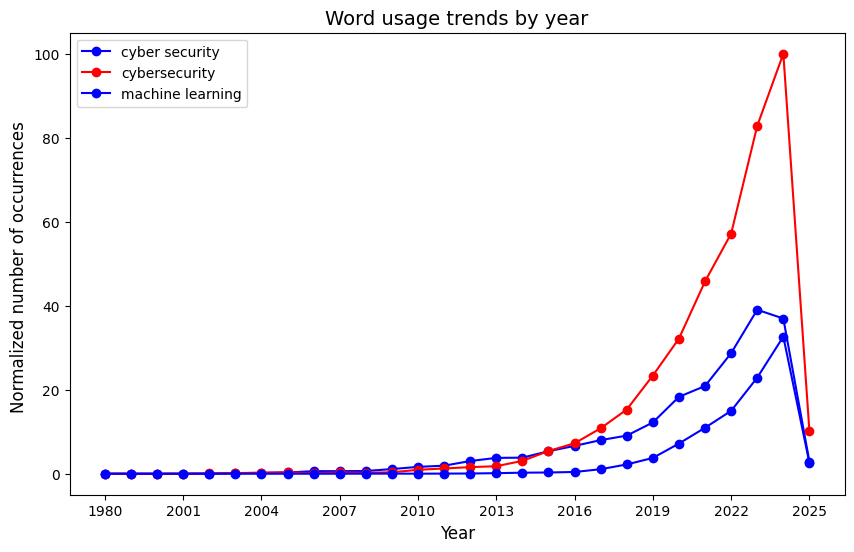

In [34]:
import re
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

def parse_ris_file(filepath):
    """
    Lit le fichier RIS et retourne une liste de dictionnaires,
    chaque dictionnaire correspondant à une référence.
    Chaque champ (par ex. PY, TI, AB, KW) est stocké sous forme de liste.
    """
    with open(filepath, 'r', encoding='utf-8') as f:
        content = f.read()
    
    # Séparer les enregistrements (chaque référence se termine par "ER  -")
    records_raw = content.split("ER  -")
    records = []
    for rec in records_raw:
        rec = rec.strip()
        if not rec:
            continue
        record = defaultdict(list)
        # Chaque ligne est de la forme "XX  - valeur"
        for line in rec.splitlines():
            if not line.strip():
                continue
            m = re.match(r'^([A-Z0-9]{2})  - (.*)$', line)
            if m:
                tag = m.group(1)
                value = m.group(2).strip()
                record[tag].append(value)
        records.append(record)
    return records

def tokenize(text):
    """
    Convertit le texte en minuscules et extrait les tokens (mots)
    à l’aide d’une expression régulière.
    """
    return re.findall(r'\b\w+\b', text.lower())

def process_records(records):
    """
    Pour chaque référence, extrait l'année (PY) et combine les champs TI, AB et KW.
    Retourne un dictionnaire : année -> texte agrégé (en minuscules).
    """
    aggregated_text = defaultdict(str)
    for rec in records:
        if 'PY' not in rec:
            continue
        year = rec['PY'][0]  # On prend la première valeur du champ PY
        combined_text = ""
        # Concaténation des champs TI et AB
        for field in ['TI', 'AB']:
            if field in rec:
                combined_text += " " + " ".join(rec[field])
        # Ajout des mots-clés (KW)
        if 'KW' in rec:
            combined_text += " " + " ".join(rec['KW'])
        
        aggregated_text[year] += " " + combined_text.lower()
    return aggregated_text

def count_phrase_in_text(text, phrase):
    """
    Compte le nombre d'occurrences d'une expression (même multi-mots) dans un texte.
    On crée un pattern flexible qui autorise des espaces multiples.
    """
    pattern = r'\b' + r'\s+'.join(map(re.escape, phrase.lower().split())) + r'\b'
    matches = re.findall(pattern, text, flags=re.IGNORECASE)
    return len(matches)

def extract_ngrams_from_text(text, n):
    """
    Extrait tous les n-grams (de taille n) du texte.
    Retourne un Counter des n-grams.
    """
    tokens = tokenize(text)
    ngrams = [' '.join(tokens[i:i+n]) for i in range(len(tokens)-n+1)]
    return Counter(ngrams)

def get_frequent_ngrams(aggregated_text, n=2, threshold=5):
    """
    Agrège les n-grams sur l'ensemble du corpus (toutes années confondues)
    et retourne un dictionnaire des n-grams dont la fréquence est supérieure au seuil.
    """
    total_counter = Counter()
    for text in aggregated_text.values():
        total_counter.update(extract_ngrams_from_text(text, n))
    return {ngram: count for ngram, count in total_counter.items() if count >= threshold}

def plot_keywords_trend(aggregated_text, keywords, normalize=True):
    """
    Affiche un graphique comparant l'évolution des occurrences de plusieurs expressions
    par année.
    
    Si normalize est True, on normalise toutes les courbes selon la même échelle :
    la valeur maximale parmi tous les mots-clés sera fixée à 100 % et
    toutes les valeurs seront exprimées en pourcentage par rapport à cette valeur.
    """
    years = sorted(aggregated_text.keys())
    plt.figure(figsize=(10, 6))
    colors = ['blue', 'red']  

    
    # Calcul de la valeur maximale globale parmi tous les mots-clés et toutes les années
    global_max = 0
    for kw in keywords:
        for y in years:
            count = count_phrase_in_text(aggregated_text[y], kw)
            if count > global_max:
                global_max = count
    if global_max == 0:
        global_max = 1  # pour éviter la division par zéro

    for idx, kw in enumerate(keywords):
        freqs = []
        for y in years:
            count = count_phrase_in_text(aggregated_text[y], kw)
            if normalize:
                norm_val = (count / global_max) * 100
                freqs.append(norm_val)
            else:
                freqs.append(count)
        color = colors[idx % len(colors)]
        plt.plot(years, freqs, marker='o', label=kw, color=color)
    
    plt.xlabel("Year", fontsize=12)
    ylabel = "Normalized number of occurrences " if normalize else "Nombre d'occurrences"
    plt.ylabel(ylabel, fontsize=12)
    plt.title("Word usage trends by year", fontsize=14)
    plt.legend()

    # Limiter le nombre de ticks sur l'axe des abscisses pour éviter le chevauchement
    ax = plt.gca()
    ax.xaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=10))

    plt.grid(False)
    #plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    plt.show()

# Spécifiez le chemin vers votre fichier RIS
filepath = '../../dataset/scientific_researches/scopus 1980-2025.ris'
#filepath = "../../samples/scopus 1980-2016.ris"
records = parse_ris_file(filepath)
aggregated_text = process_records(records)

# Extraction automatique des bigrams fréquents (par exemple, seuil >= 5 occurrences)
frequent_bigrams = get_frequent_ngrams(aggregated_text, n=2, threshold=5)
print("Bigrams fréquents :", frequent_bigrams)

# Exemple de comparaison sur une figure : vous pouvez choisir des expressions parmi les résultats
keywords = ["cyber security", "cybersecurity", "machine learning"]
plot_keywords_trend(aggregated_text, keywords, normalize=True)



# Ratio term1 % term 2 over years

Bigrams fréquents : {'cybersecurity in': 2812, 'in industrial': 842, 'industrial control': 3434, 'control systems': 5455, 'systems issues': 8, 'technologies and': 1428, 'and challenges': 1438, 'challenges industrial': 9, 'systems icss': 147, 'play an': 218, 'an important': 1708, 'important role': 460, 'role in': 2079, 'in today': 831, 'today s': 1413, 's industry': 15, 'industry by': 57, 'by providing': 637, 'process automation': 152, 'automation distributed': 6, 'distributed control': 304, 'control and': 1908, 'and process': 324, 'process monitoring': 57, 'was designed': 185, 'designed to': 1744, 'to be': 8303, 'be used': 3465, 'used in': 2967, 'in an': 2632, 'an isolated': 41, 'area or': 9, 'or connected': 11, 'connected to': 763, 'to other': 753, 'other systems': 76, 'systems via': 44, 'communication mechanisms': 15, 'mechanisms or': 10, 'protocols this': 48, 'this setup': 9, 'manufacturers to': 50, 'to manage': 762, 'manage their': 91, 'their production': 20, 'production processes'

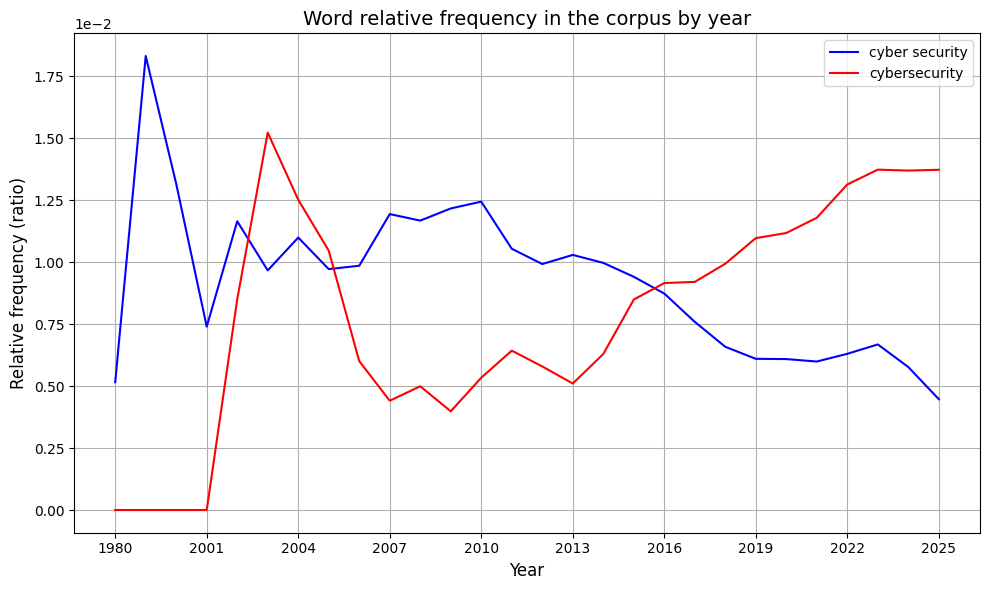

In [22]:
import re
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import numpy as np
import nltk
from nltk.corpus import stopwords

# Télécharger les stop words une seule fois
nltk.download('stopwords', quiet=True)
STOP_WORDS = set(stopwords.words('english'))

def parse_ris_file(filepath):
    """
    Lit le fichier RIS et retourne une liste de dictionnaires,
    chaque dictionnaire correspondant à une référence.
    Chaque champ (par ex. PY, TI, AB, KW) est stocké sous forme de liste.
    """
    with open(filepath, 'r', encoding='utf-8') as f:
        content = f.read()
    
    # Séparer les enregistrements (chaque référence se termine par "ER  -")
    records_raw = content.split("ER  -")
    records = []
    for rec in records_raw:
        rec = rec.strip()
        if not rec:
            continue
        record = defaultdict(list)
        # Chaque ligne est de la forme "XX  - valeur"
        for line in rec.splitlines():
            if not line.strip():
                continue
            m = re.match(r'^([A-Z0-9]{2})  - (.*)$', line)
            if m:
                tag = m.group(1)
                value = m.group(2).strip()
                record[tag].append(value)
        records.append(record)
    return records

def tokenize(text):
    """
    Convertit le texte en minuscules et extrait les tokens (mots)
    à l’aide d’une expression régulière.
    """
    return re.findall(r'\b\w+\b', text.lower())

def process_records(records):
    """
    Pour chaque référence, extrait l'année (PY) et combine les champs TI, AB et KW.
    Retourne un dictionnaire : année -> texte agrégé (en minuscules).
    """
    aggregated_text = defaultdict(str)
    for rec in records:
        if 'PY' not in rec:
            continue
        year = rec['PY'][0]  # On prend la première valeur du champ PY
        combined_text = ""
        for field in ['TI', 'AB']:
            if field in rec:
                combined_text += " " + " ".join(rec[field])
        if 'KW' in rec:
            combined_text += " " + " ".join(rec['KW'])
        aggregated_text[year] += " " + combined_text.lower()
    return aggregated_text

def compute_total_tokens(aggregated_text, remove_stopwords=True):
    """
    Calcule pour chaque année le nombre total de tokens (mots) dans le texte agrégé.
    Si remove_stopwords est True, enlève les stop words en anglais.
    Retourne un dictionnaire : année -> nombre total de tokens.
    """
    total_tokens = {}
    for year, text in aggregated_text.items():
        tokens = tokenize(text)
        if remove_stopwords:
            tokens = [token for token in tokens if token not in STOP_WORDS]
        total_tokens[year] = len(tokens)
    return total_tokens

def count_phrase_in_text(text, phrase):
    """
    Compte le nombre d'occurrences d'une expression (même multi-mots) dans un texte.
    On crée un pattern flexible qui autorise des espaces multiples.
    """
    pattern = r'\b' + r'\s+'.join(map(re.escape, phrase.lower().split())) + r'\b'
    matches = re.findall(pattern, text, flags=re.IGNORECASE)
    return len(matches)

def extract_ngrams_from_text(text, n):
    """
    Extrait tous les n-grams (de taille n) du texte.
    Retourne un Counter des n-grams.
    """
    tokens = tokenize(text)
    ngrams = [' '.join(tokens[i:i+n]) for i in range(len(tokens)-n+1)]
    return Counter(ngrams)

def get_frequent_ngrams(aggregated_text, n=2, threshold=5):
    """
    Agrège les n-grams sur l'ensemble du corpus (toutes années confondues)
    et retourne un dictionnaire des n-grams dont la fréquence est supérieure au seuil.
    """
    total_counter = Counter()
    for text in aggregated_text.values():
        total_counter.update(extract_ngrams_from_text(text, n))
    return {ngram: count for ngram, count in total_counter.items() if count >= threshold}

def smooth_data(data, window_size):
    """
    Applique une moyenne glissante sur la liste de données 'data' avec une fenêtre de taille 'window_size'.
    """
    kernel = np.ones(window_size) / window_size
    return np.convolve(data, kernel, mode='same')

def plot_keywords_trend(aggregated_text, keywords, relative=True, remove_stopwords=True, show_points=False, smoothing_window=1):
    """
    Affiche un graphique comparant l'évolution des occurrences de plusieurs expressions par année.
    
    - Si relative est True, la fréquence relative est calculée comme (nombre d'occurrences / nombre total de tokens)
      (valeurs entre 0 et 1).
    - Si show_points est False, la courbe sera tracée sans marqueurs.
    - Si smoothing_window > 1, les données sont lissées par une moyenne glissante.
    
    L'axe des ordonnées est affiché en notation scientifique.
    Des améliorations esthétiques sont appliquées pour éviter la surcharge de l'axe des abscisses.
    """
    years = sorted(aggregated_text.keys())
    total_tokens = compute_total_tokens(aggregated_text, remove_stopwords=remove_stopwords)
    
    # Calcul du total global de tokens sur l'ensemble du corpus
    global_total_tokens = sum(total_tokens.values())
    print("Nombre total de mots (hors stop words) par année :")
    for year, count in sorted(total_tokens.items()):
        print(f"{year} : {count}")
    ret = f"\nTotal number of words (without stop words) in the corpus : {global_total_tokens}\n" if remove_stopwords else f"\nTotal number of words (with stop words) in the corpus : {global_total_tokens}\n"
    print(ret)

    plt.figure(figsize=(10, 6))
    colors = ['blue', 'red']  

    for idx, kw in enumerate(keywords):
        freqs = []
        for y in years:
            raw_count = count_phrase_in_text(aggregated_text[y], kw)
            if relative and total_tokens.get(y, 0) > 0:
                freq = raw_count / total_tokens[y]
            else:
                freq = raw_count
            freqs.append(freq)
        
        # Appliquer le lissage si nécessaire
        if smoothing_window > 1:
            freqs = smooth_data(freqs, smoothing_window)
        
        marker = 'o' if show_points else None
        color = colors[idx % len(colors)]
        plt.plot(years, freqs, marker=marker, label=kw, color=color)
    
    plt.xlabel("Year", fontsize=12)
    ylabel = "Relative frequency (ratio)" if relative else "Frequency"
    plt.ylabel(ylabel, fontsize=12)
    title = "Word relative frequency in the corpus by year" if relative else "Word frequency in the corpus by year"
    plt.title(title, fontsize=14)
    plt.legend()
    plt.grid(True)
    
    # Limiter le nombre de ticks sur l'axe des abscisses pour éviter le chevauchement
    ax = plt.gca()
    ax.xaxis.set_major_locator(mticker.MaxNLocator(integer=True, nbins=10))
    
    # Formatage en écriture scientifique pour l'axe des ordonnées
    plt.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    
    plt.tight_layout()
    plt.show()

# Spécifiez le chemin vers votre fichier RIS
filepath = "../../dataset/scientific_researches/scopus 1980-2025.ris"
records = parse_ris_file(filepath)
aggregated_text = process_records(records)

# Extraction automatique des bigrams fréquents (par exemple, seuil >= 5 occurrences)
frequent_bigrams = get_frequent_ngrams(aggregated_text, n=2, threshold=5)
print("Bigrams fréquents :", frequent_bigrams)

# Exemple de comparaison sur une figure : choisir des expressions ou mots-clés
keywords = ["cyber security", "cybersecurity"]

# Tracer la courbe avec fréquence relative (valeurs entre 0 et 1) en écriture scientifique,
# sans points et avec un lissage (par exemple, fenêtre de 3 années)
plot_keywords_trend(aggregated_text, keywords, relative=True, remove_stopwords=True, show_points=False, smoothing_window=2)


# Counters

1. First year of the occurence
2. Nb Occurences 'Term' per year

In [2]:
import re

def trouver_plus_ancienne_date(fichier_ris, terme="cybersecurity"):
    # Convertir le terme en minuscule pour comparaison insensible à la casse
    terme = terme.lower()
    plus_ancienne = None

    # Lire le contenu du fichier RIS
    with open(fichier_ris, "r", encoding="utf-8") as f:
        contenu = f.read()

    # Chaque entrée RIS se termine par la ligne "ER  -"
    entrees = contenu.split("ER  -")
    for entree in entrees:
        # Vérifier si le terme apparaît dans l'entrée (on cherche dans tout le texte)
        if terme in entree.lower():
            # Rechercher le champ de publication (PY) qui suit le format "PY  - 2025"
            match = re.search(r"PY\s+-\s*(\d{4})", entree)
            if match:
                annee = int(match.group(1))
                # Mise à jour de la plus ancienne date
                if plus_ancienne is None or annee < plus_ancienne:
                    plus_ancienne = annee

    return plus_ancienne, count

# Exemple d'utilisation :
fichier = "../../samples/scopus 1980-2025.ris"  # Remplacez par le chemin de votre fichier RIS
date_min,count = trouver_plus_ancienne_date(fichier)
if date_min:
    print(f"La plus ancienne date d'une entrée contenant 'cybersecurity' est : {date_min}")
else:
    print("Aucune entrée contenant 'cybersecurity' n'a été trouvée.")


La plus ancienne date d'une entrée contenant 'cybersecurity' est : 2002, count:18


In [17]:
import re

def compter_terme_annee(fichier_ris, annee_cible=2002, terme="cybersecurity"):
    terme = terme.lower()
    compteur = 0

    with open(fichier_ris, "r", encoding="utf-8") as f:
        contenu = f.read()

    # Découper le fichier en entrées (chaque entrée se termine par "ER  -")
    entrees = contenu.split("ER  -")
    
    for entree in entrees:
        # Rechercher l'année de publication (champ PY)
        match = re.search(r"PY\s+-\s*(\d{4})", entree)
        if match and int(match.group(1)) == annee_cible:
            # Compter les occurrences du terme dans toute l'entrée (peut être adapté pour cibler uniquement KW)
            compteur += entree.lower().count(terme)
    
    return compteur

# Exemple d'utilisation :
fichier = "../../samples/scopus 1980-2025.ris"  # Remplacez par le chemin de votre fichier RIS
terme = "cyber security"
nombre_occurrences = compter_terme_annee(fichier, annee_cible=2002, terme=terme)
print(f"Le terme {terme} apparaît {nombre_occurrences} fois dans les échantillons de 2002.")


Le terme cyber security apparaît 8 fois dans les échantillons de 2002.


# ANALYSE FACTORIELLE DE CORRESPONDANCE 


Table de contingence (aperçu) :
      security  cyber  systems  system  information  cybersecurity  data  \
2016      4643   3916     1623    1433         1322           1709  1466   
2015      3496   3096     1114     899         1042           1274   973   
2014      2414   2115      813     735          693            722   683   
2013      2433   2166      768     665          609            422   422   
2012      1734   1576      631     556          618            369   417   

      control  network  paper  ...  communication  process  design  national  \
2016      765      922    975  ...            371      315     328       294   
2015      654      678    694  ...            264      306     272       230   
2014      447      520    476  ...            197      150     194       194   
2013      522      407    453  ...            174      145     146       167   
2012      398      345    369  ...            164      144     120       120   

      threat  international  d

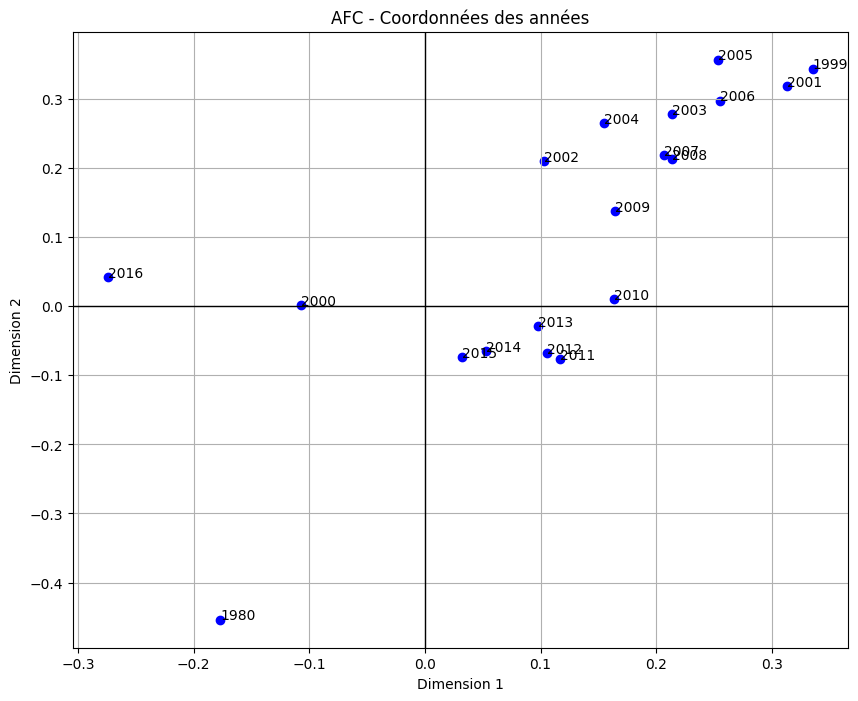

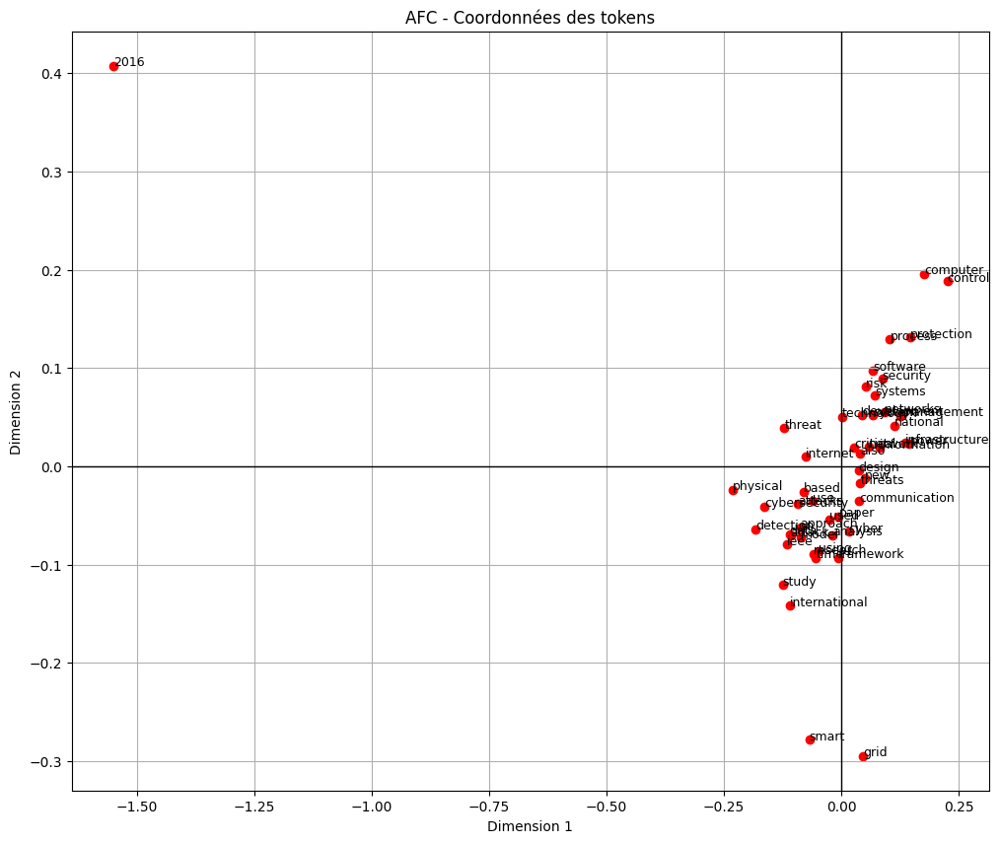

In [25]:
import re
from collections import defaultdict, Counter
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import pandas as pd
import prince
import nltk
from nltk.corpus import stopwords

# Télécharger les stop words une seule fois
nltk.download('stopwords', quiet=True)
STOP_WORDS = set(stopwords.words('english'))

def parse_ris_file(filepath):
    """
    Lit le fichier RIS et retourne une liste de dictionnaires,
    chaque dictionnaire correspondant à une référence.
    Chaque champ (par ex. PY, TI, AB, KW) est stocké sous forme de liste.
    """
    with open(filepath, 'r', encoding='utf-8') as f:
        content = f.read()
    
    # Séparer les enregistrements (chaque référence se termine par "ER  -")
    records_raw = content.split("ER  -")
    records = []
    for rec in records_raw:
        rec = rec.strip()
        if not rec:
            continue
        record = defaultdict(list)
        for line in rec.splitlines():
            if not line.strip():
                continue
            m = re.match(r'^([A-Z0-9]{2})  - (.*)$', line)
            if m:
                tag = m.group(1)
                value = m.group(2).strip()
                record[tag].append(value)
        records.append(record)
    return records

def tokenize(text):
    """
    Convertit le texte en minuscules et extrait les tokens (mots)
    à l’aide d’une expression régulière simple.
    """
    return re.findall(r'\b\w+\b', text.lower())

def process_records(records):
    """
    Pour chaque référence, extrait l'année (PY) et combine les champs TI, AB et KW.
    Retourne un dictionnaire : année -> texte agrégé (en minuscules).
    """
    aggregated_text = defaultdict(str)
    for rec in records:
        if 'PY' not in rec:
            continue
        year = rec['PY'][0]
        combined_text = ""
        for field in ['TI', 'AB']:
            if field in rec:
                combined_text += " " + " ".join(rec[field])
        if 'KW' in rec:
            combined_text += " " + " ".join(rec['KW'])
        aggregated_text[year] += " " + combined_text.lower()
    return aggregated_text

def build_contingency_table(aggregated_text, top_n=50, min_freq=10, remove_stopwords=True):
    """
    Construit une table de contingence à partir du texte agrégé par année.
    Les lignes correspondent aux années et les colonnes aux tokens.
    Seuls les tokens apparaissant au moins min_freq fois et faisant partie
    des top_n tokens (selon leur fréquence globale) sont retenus.
    """
    # Compter globalement la fréquence de chaque token
    global_counter = Counter()
    for year, text in aggregated_text.items():
        tokens = tokenize(text)
        if remove_stopwords:
            tokens = [t for t in tokens if t not in STOP_WORDS]
        global_counter.update(tokens)
    
    # Filtrer tokens avec une fréquence minimale
    filtered_tokens = {token: count for token, count in global_counter.items() if count >= min_freq}
    # Sélectionner les top_n tokens
    top_tokens = sorted(filtered_tokens.items(), key=lambda x: x[1], reverse=True)[:top_n]
    top_tokens = [token for token, count in top_tokens]
    
    # Construire la table de contingence
    data = {}
    for year, text in aggregated_text.items():
        tokens = tokenize(text)
        if remove_stopwords:
            tokens = [t for t in tokens if t not in STOP_WORDS]
        counter = Counter(tokens)
        row = {token: counter.get(token, 0) for token in top_tokens}
        data[year] = row
    df = pd.DataFrame.from_dict(data, orient='index')
    df = df.fillna(0)
    return df

# Lecture et traitement du fichier RIS
filepath = "../../samples/scopus 1980-2016.ris"
records = parse_ris_file(filepath)
aggregated_text = process_records(records)

# Construction de la table de contingence (par exemple, top 50 tokens avec fréquence minimale 10)
contingency_df = build_contingency_table(aggregated_text, top_n=50, min_freq=10, remove_stopwords=True)
print("Table de contingence (aperçu) :")
print(contingency_df.head())

# Réalisation de l'Analyse Factorielle de Correspondance (AFC)
ca = prince.CA(n_components=2, n_iter=10, copy=True, check_input=True, engine='scipy', random_state=42)
ca = ca.fit(contingency_df)
print("Inertie expliquée par les dimensions :")
# Récupérer les valeurs propres
eigenvalues = ca.eigenvalues_
total_inertia = sum(eigenvalues)
explained_inertia = [eig / total_inertia for eig in eigenvalues]
print("Inertie expliquée par dimension :", explained_inertia)

# Affichage des coordonnées principales des lignes (années)
row_coords = ca.row_coordinates(contingency_df)
plt.figure(figsize=(10,8))
plt.scatter(row_coords[0], row_coords[1], c='blue')
for i, year in enumerate(contingency_df.index):
    plt.text(row_coords.iloc[i, 0], row_coords.iloc[i, 1], str(year))

plt.axhline(0, color='black', linewidth=1)
plt.axvline(0, color='black', linewidth=1)
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("AFC - Coordonnées des années")
plt.grid(True)
plt.show()

# Affichage des coordonnées principales des colonnes (tokens)
col_coords = ca.column_coordinates(contingency_df)
plt.figure(figsize=(12,10))
plt.scatter(col_coords[0], col_coords[1], c='red')
for i, token in enumerate(contingency_df.columns):
    plt.text(col_coords.iloc[i, 0], col_coords.iloc[i, 1], token, fontsize=9)
    
plt.axhline(0, color='black', linewidth=1)
plt.axvline(0, color='black', linewidth=1)
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("AFC - Coordonnées des tokens")
plt.grid(True)
plt.show()
